In [2]:
#import library
import tensorflow as tf
import random as rn
import cv2                  
import numpy as np  
from tqdm import tqdm
import os                   
from random import shuffle  
from zipfile import ZipFile
from PIL import Image
import keras.preprocessing.image as img
from keras.applications.resnet50 import ResNet50
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
%matplotlib inline  
style.use('ggplot')
sns.set(style='whitegrid',color_codes=True)

#model selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score,precision_score,recall_score,confusion_matrix,roc_curve,roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder

#preprocess.
from keras.preprocessing.image import ImageDataGenerator

#dl libraraies
from keras import backend as K
from keras import regularizers
from keras.models import Sequential
from keras.models import Model
from keras.layers import Dense
from keras.optimizers import Adam,SGD,Adagrad,Adadelta,RMSprop
from keras.utils import to_categorical
from keras.callbacks import ReduceLROnPlateau

# specifically for cnn
from keras.layers import Dropout, Flatten,Activation
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras.layers import InputLayer
 


Instructions for updating:
non-resource variables are not supported in the long term


Using TensorFlow backend.


In [3]:
os.listdir('/content/drive/My Drive/My Dataset/train')

['Plain', 'Pothole']

In [0]:
#resize image 256x256, convert image to array
def make_train_data(label,DIR):
    for img in tqdm(os.listdir(DIR)):
        try:
            path = os.path.join(DIR,img)
            img = cv2.imread(path,cv2.IMREAD_COLOR)
            img = cv2.resize(img, (IMG_SIZE,IMG_SIZE))

            X.append(np.array(img))
            Z.append(str(label))
        except:
            pass
        
def assign_label(img,label):
    return label

In [5]:
X=[]
Z=[]
IMG_SIZE=256
Plain='/content/drive/My Drive/My Dataset/train/Plain'
Pothole='/content/drive/My Drive/My Dataset/train/Pothole'
#set label for data
make_train_data('Plain',Plain)
make_train_data('Pothole',Pothole)

100%|██████████| 357/357 [02:45<00:00,  2.43it/s]


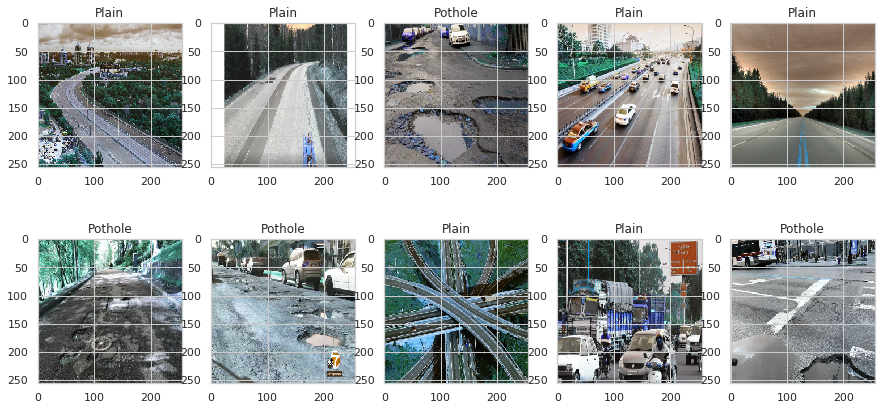

In [6]:
fig,ax=plt.subplots(2,5)
plt.subplots_adjust(bottom=0.3, top=0.7, hspace=0)
fig.set_size_inches(15,15)
#show several images
for i in range(2):
    for j in range (5):
        l=rn.randint(0,len(Z))
        ax[i,j].imshow(X[l][:])
        ax[i,j].set_title(Z[l])
        ax[i,j].set_aspect('equal')

In [7]:
le=LabelEncoder()
Y=le.fit_transform(Z)
Y=to_categorical(Y,2)# transform label to 0 and 1
print(Y)
X=np.array(X)
#rate 75:25
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.25,random_state=1337)

np.random.seed(42)
rn.seed(42)

[[1. 0.]
 [1. 0.]
 [1. 0.]
 ...
 [0. 1.]
 [0. 1.]
 [0. 1.]]


In [8]:
Res_model=ResNet50(include_top=False, weights='imagenet',input_shape=(256,256,3), pooling='max')
'''include_top=False : load a network that doesn't include the classification layers at the top,
 which is ideal for feature extraction
'''
Res_model.summary()













94658560/94653016 [==============================] - 8s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 3)  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 262, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1 (Conv2D)                  (None, 128, 128, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_conv1 (BatchNormalization)   (None, 128, 128, 64) 256         conv1[0][0]                      
______________

In [9]:
model=Sequential()
model.add(Res_model)
model.add(Dropout(0.20))
model.add(Dense(2048,activation='relu'))
model.add(Dense(1024,activation='relu'))
model.add(Dense(512,activation='relu'))
model.add(Dense(2,activation='softmax'))

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.



In [10]:
epochs=50
batch_size=128
red_lr=ReduceLROnPlateau(monitor='val_acc', factor=0.1, min_delta=0.0001, patience=2, verbose=1)
Res_model.trainable=False
'''
 prevent the weights in a given layer from being updated during training.
Resnet has many layers, so setting the entire model's trainable flag to False will freeze all the layers.
'''
model.compile(optimizer=Adam(lr=1e-5),loss='categorical_crossentropy',metrics=['accuracy'])
model.summary()



Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 2048)              23587712  
_________________________________________________________________
dropout_1 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 2048)              4196352   
_________________________________________________________________
dense_2 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
dense_3 (Dense)              (None, 512)               524800    
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 1026      
Total params: 30,408,066
Trainable params: 6,820,354
Non-trainable params: 23,587,712
________________________________

In [11]:
history = model.fit(x_train, y_train, epochs=epochs, validation_data=(x_test,y_test))

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 541 samples, validate on 181 samples
Epoch 1/50
541/541 [==============================] - 15s 29ms/step - loss: 1.1351 - acc: 0.6377 - val_loss: 0.2506 - val_acc: 0.9006
Epoch 2/50
541/541 [==============================] - 5s 9ms/step - loss: 0.4221 - acc: 0.8392 - val_loss: 0.1607 - val_acc: 0.9227
Epoch 3/50
541/541 [==============================] - 5s 9ms/step - loss: 0.3096 - acc: 0.8909 - val_loss: 0.1206 - val_acc: 0.9337
Epoch 4/50
541/541 [==============================] - 5s 9ms/step - loss: 0.2678 - acc: 0.8983 - val_loss: 0.1082 - val_acc: 0.9503
Epoch 5/50
541/541 [==============================] - 5s 9ms/step - loss: 0.1744 - acc: 0.9335 - val_loss: 0.1205 - val_acc: 0.9558
Epoch 6/50
541/541 [==============================] - 5s 9ms/step - loss: 0.1542 - acc: 0.9538 - val_loss: 0.1005 - val_acc: 0.9613
Epoch 7/50
541/541 [==============================] - 5s 9ms/ste

In [0]:
model.save('/content/drive/My Drive/My Dataset/Res_model.h5')

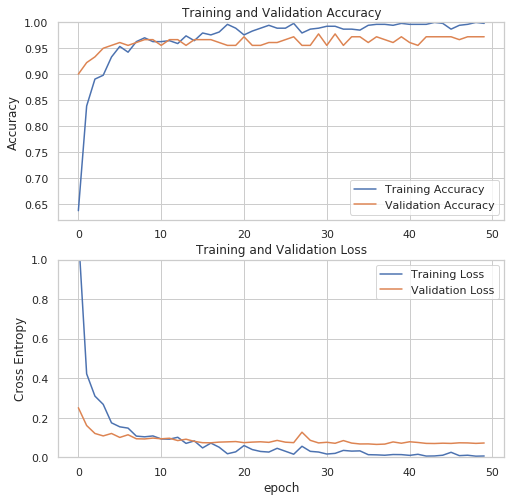

In [13]:
acc = history.history['acc']
val_acc = history.history['val_acc']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()


In [14]:
from keras.models import load_model
model = load_model('/content/drive/My Drive/My Dataset/Res_model.h5')

/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:350: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


In [0]:
import random
path = "/content/drive/My Drive/My Dataset/test"
files = os.listdir(path)
random.shuffle(files)

  0%|          | 0/80 [00:00<?, ?it/s]

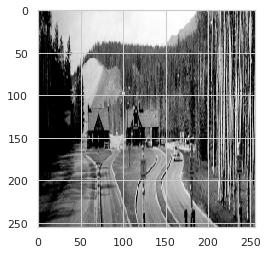

  1%|▏         | 1/80 [00:08<11:01,  8.37s/it]

Plain Road


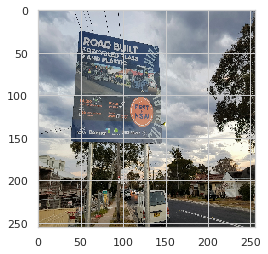

  2%|▎         | 2/80 [00:09<08:06,  6.24s/it]

Plain Road


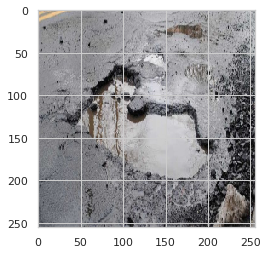

  4%|▍         | 3/80 [00:10<05:51,  4.57s/it]

Pothole Road


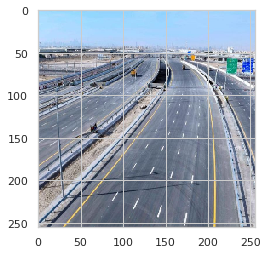

  5%|▌         | 4/80 [00:10<04:17,  3.39s/it]

Plain Road


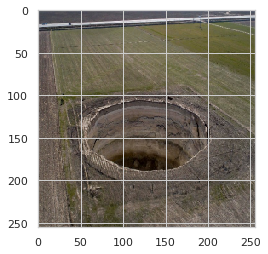

  6%|▋         | 5/80 [00:11<03:13,  2.57s/it]

Pothole Road


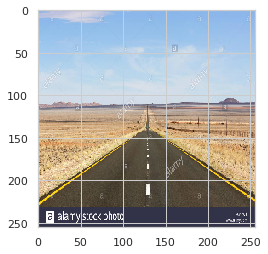

  8%|▊         | 6/80 [00:13<02:57,  2.40s/it]

Plain Road


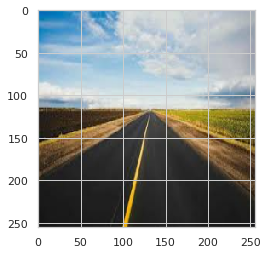

  9%|▉         | 7/80 [00:14<02:17,  1.88s/it]

Plain Road


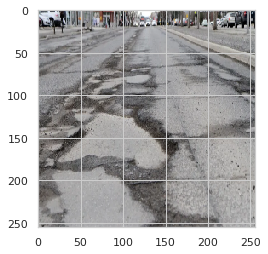

 10%|█         | 8/80 [00:14<01:48,  1.51s/it]

Pothole Road


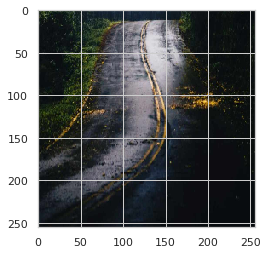

 11%|█▏        | 9/80 [00:15<01:30,  1.27s/it]

Plain Road


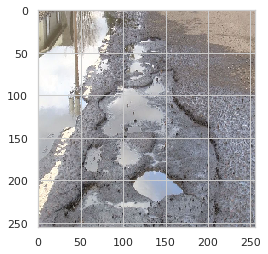

 12%|█▎        | 10/80 [00:16<01:16,  1.10s/it]

Pothole Road


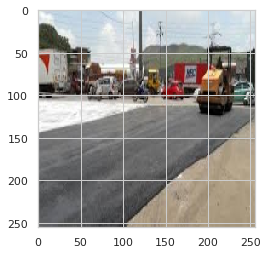

 14%|█▍        | 11/80 [00:16<01:06,  1.04it/s]

Plain Road


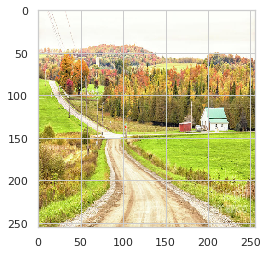

 15%|█▌        | 12/80 [00:17<00:59,  1.14it/s]

Plain Road


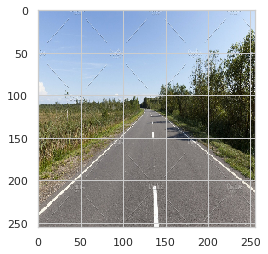

 16%|█▋        | 13/80 [00:18<00:54,  1.23it/s]

Plain Road


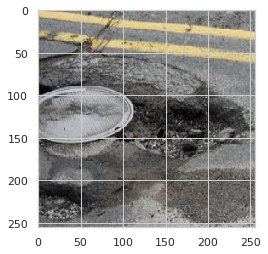

 18%|█▊        | 14/80 [00:18<00:50,  1.31it/s]

Pothole Road


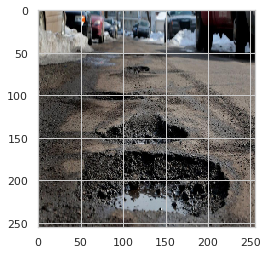

 19%|█▉        | 15/80 [00:19<00:47,  1.36it/s]

Pothole Road


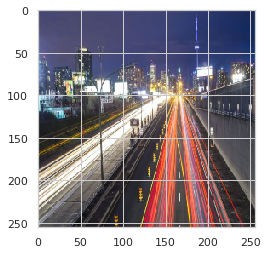

 20%|██        | 16/80 [00:20<00:45,  1.40it/s]

Plain Road


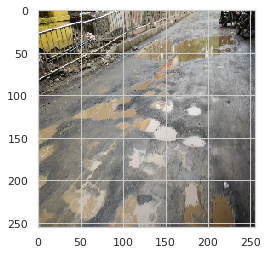

 21%|██▏       | 17/80 [00:21<00:51,  1.21it/s]

Pothole Road


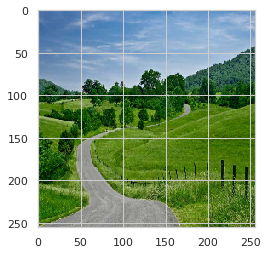

 22%|██▎       | 18/80 [00:22<00:48,  1.27it/s]

Plain Road


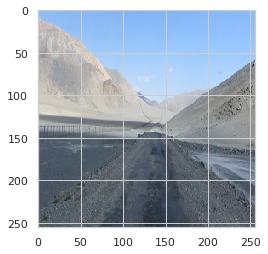

 24%|██▍       | 19/80 [00:22<00:45,  1.33it/s]

Plain Road


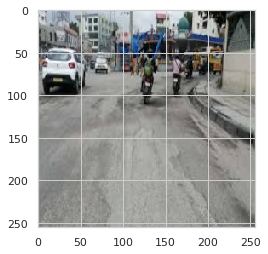

 25%|██▌       | 20/80 [00:23<00:44,  1.36it/s]

Pothole Road


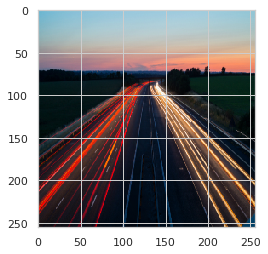

 26%|██▋       | 21/80 [00:24<00:42,  1.38it/s]

Plain Road


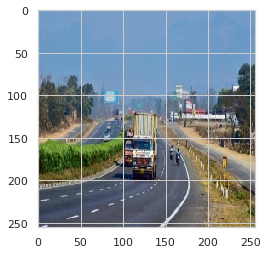

 28%|██▊       | 22/80 [00:24<00:40,  1.45it/s]

Plain Road


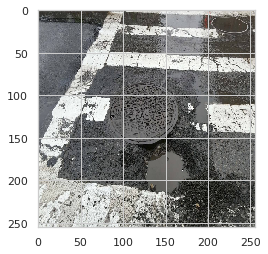

 29%|██▉       | 23/80 [00:25<00:38,  1.46it/s]

Pothole Road


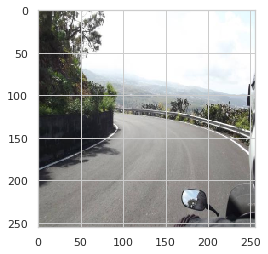

 30%|███       | 24/80 [00:26<00:37,  1.48it/s]

Pothole Road


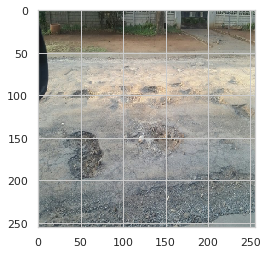

 31%|███▏      | 25/80 [00:26<00:36,  1.50it/s]

Pothole Road


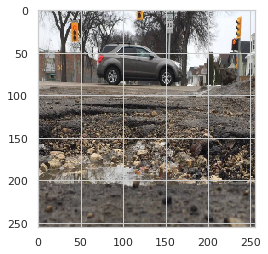

 32%|███▎      | 26/80 [00:27<00:36,  1.47it/s]

Pothole Road


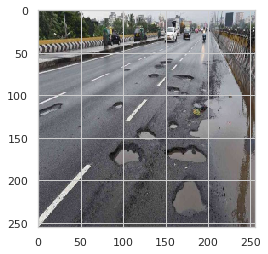

 34%|███▍      | 27/80 [00:28<00:36,  1.46it/s]

Pothole Road


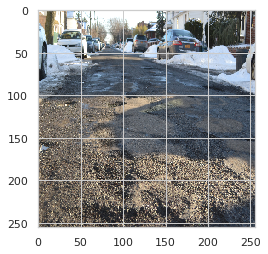

 35%|███▌      | 28/80 [00:29<00:53,  1.02s/it]

Pothole Road


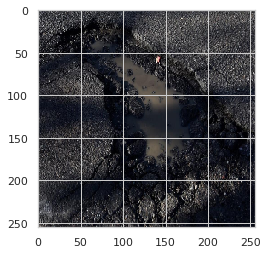

 36%|███▋      | 29/80 [00:30<00:48,  1.06it/s]

Pothole Road


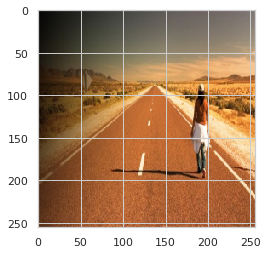

 38%|███▊      | 30/80 [00:31<00:43,  1.14it/s]

Plain Road


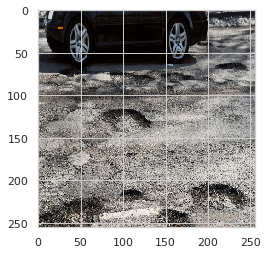

 39%|███▉      | 31/80 [00:32<00:40,  1.21it/s]

Pothole Road


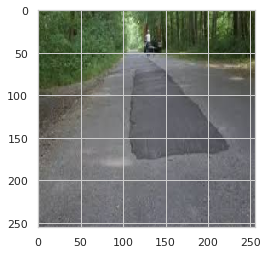

 40%|████      | 32/80 [00:32<00:37,  1.28it/s]

Pothole Road


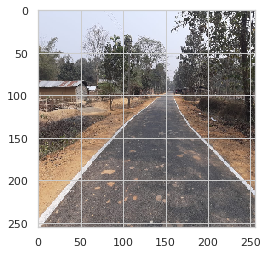

 41%|████▏     | 33/80 [00:33<00:34,  1.36it/s]

Plain Road


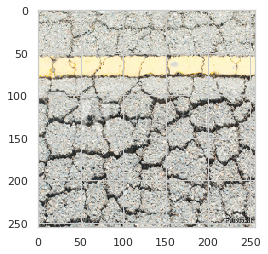

 42%|████▎     | 34/80 [00:34<00:35,  1.28it/s]

Pothole Road


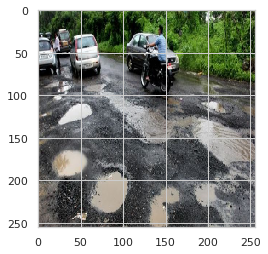

 44%|████▍     | 35/80 [00:35<00:33,  1.33it/s]

Pothole Road


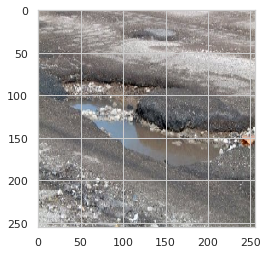

 45%|████▌     | 36/80 [00:35<00:31,  1.40it/s]

Pothole Road


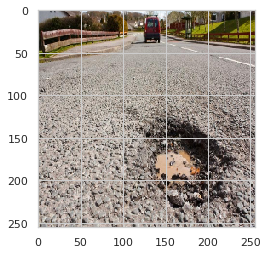

 46%|████▋     | 37/80 [00:36<00:30,  1.40it/s]

Pothole Road


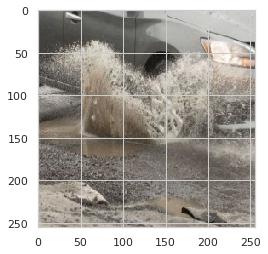

 48%|████▊     | 38/80 [00:37<00:29,  1.40it/s]

Pothole Road


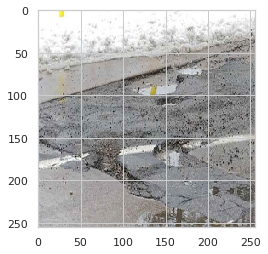

 49%|████▉     | 39/80 [00:37<00:28,  1.45it/s]

Pothole Road


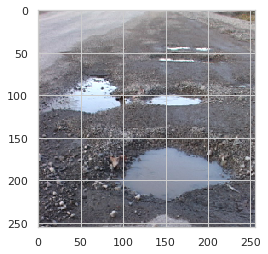

 50%|█████     | 40/80 [00:38<00:34,  1.16it/s]

Pothole Road


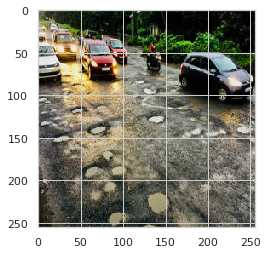

 51%|█████▏    | 41/80 [00:39<00:31,  1.25it/s]

Pothole Road


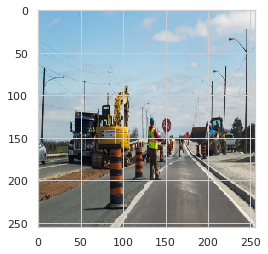

 52%|█████▎    | 42/80 [00:40<00:28,  1.33it/s]

Plain Road


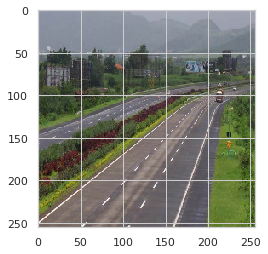

 54%|█████▍    | 43/80 [00:40<00:26,  1.39it/s]

Plain Road


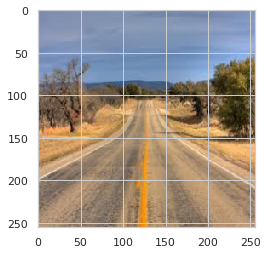

 55%|█████▌    | 44/80 [00:41<00:24,  1.45it/s]

Plain Road


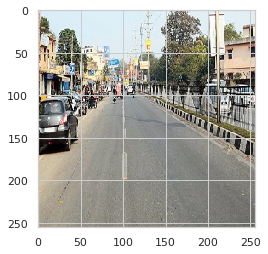

 56%|█████▋    | 45/80 [00:42<00:23,  1.48it/s]

Plain Road


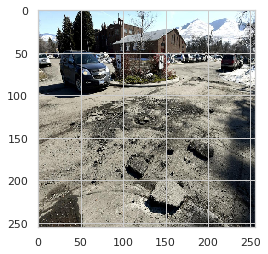

 57%|█████▊    | 46/80 [00:42<00:23,  1.47it/s]

Pothole Road


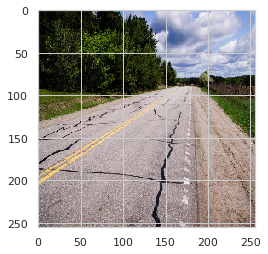

 59%|█████▉    | 47/80 [00:43<00:21,  1.51it/s]

Plain Road


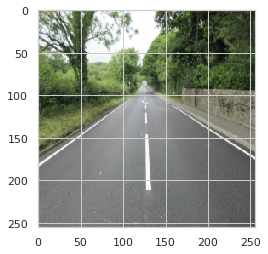

 60%|██████    | 48/80 [00:44<00:22,  1.39it/s]

Plain Road


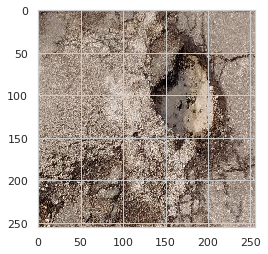

 61%|██████▏   | 49/80 [00:45<00:22,  1.40it/s]

Pothole Road


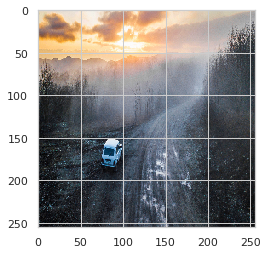

 62%|██████▎   | 50/80 [00:46<00:24,  1.22it/s]

Plain Road


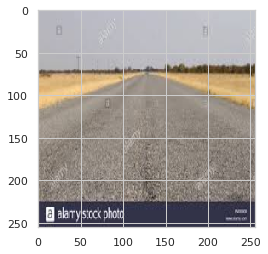

 64%|██████▍   | 51/80 [00:46<00:22,  1.32it/s]

Plain Road


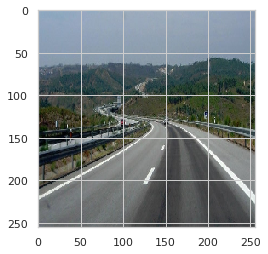

 65%|██████▌   | 52/80 [00:47<00:20,  1.37it/s]

Plain Road


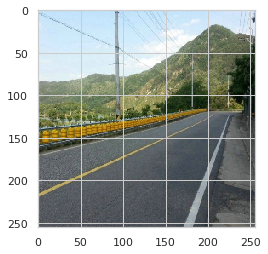

 66%|██████▋   | 53/80 [00:48<00:19,  1.39it/s]

Plain Road


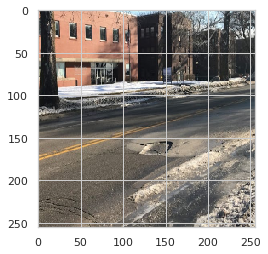

 68%|██████▊   | 54/80 [00:48<00:18,  1.39it/s]

Pothole Road


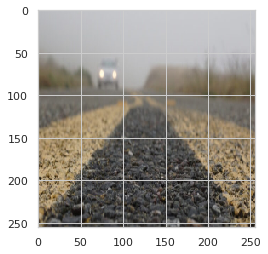

 69%|██████▉   | 55/80 [00:49<00:17,  1.44it/s]

Pothole Road


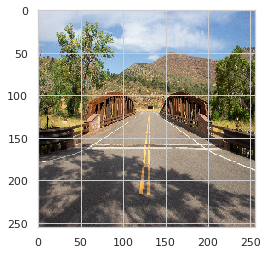

 70%|███████   | 56/80 [00:50<00:22,  1.05it/s]

Plain Road


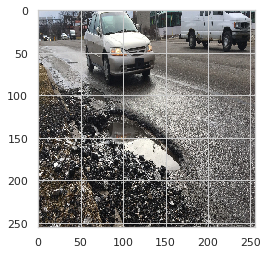

 71%|███████▏  | 57/80 [00:52<00:22,  1.02it/s]

Pothole Road


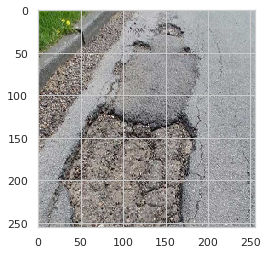

 72%|███████▎  | 58/80 [00:52<00:19,  1.11it/s]

Pothole Road


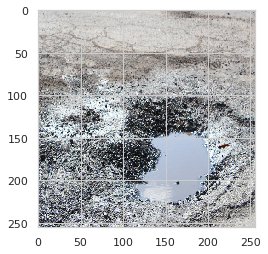

 74%|███████▍  | 59/80 [00:54<00:25,  1.23s/it]

Pothole Road


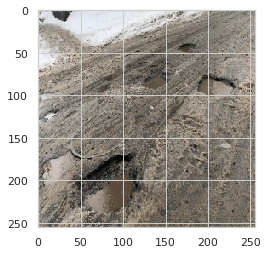

 75%|███████▌  | 60/80 [00:55<00:21,  1.06s/it]

Pothole Road


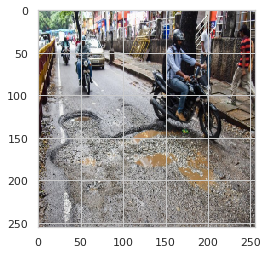

 76%|███████▋  | 61/80 [00:55<00:17,  1.08it/s]

Pothole Road


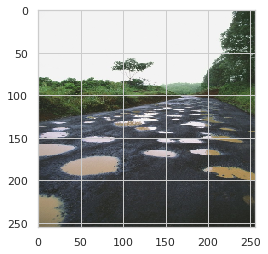

 78%|███████▊  | 62/80 [00:56<00:15,  1.20it/s]

Pothole Road


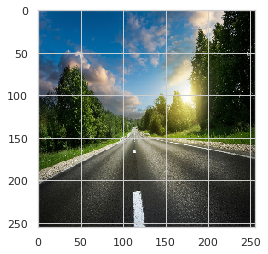

 79%|███████▉  | 63/80 [00:57<00:13,  1.26it/s]

Plain Road


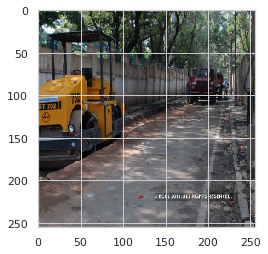

 80%|████████  | 64/80 [00:57<00:11,  1.34it/s]

Plain Road


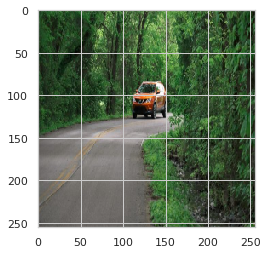

 81%|████████▏ | 65/80 [00:58<00:10,  1.42it/s]

Plain Road


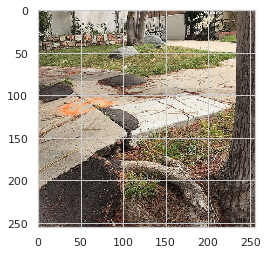

 82%|████████▎ | 66/80 [00:59<00:09,  1.44it/s]

Pothole Road


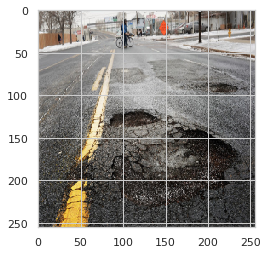

 84%|████████▍ | 67/80 [00:59<00:08,  1.46it/s]

Pothole Road


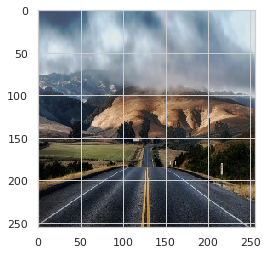

 85%|████████▌ | 68/80 [01:00<00:08,  1.49it/s]

Plain Road


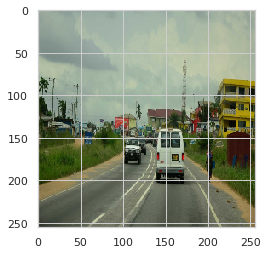

 86%|████████▋ | 69/80 [01:01<00:07,  1.52it/s]

Plain Road


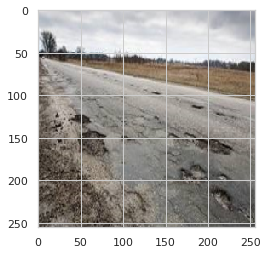

 88%|████████▊ | 70/80 [01:01<00:06,  1.54it/s]

Pothole Road


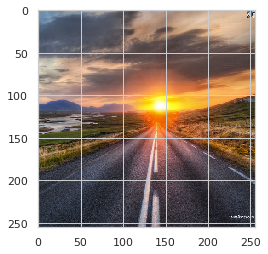

 89%|████████▉ | 71/80 [01:02<00:05,  1.52it/s]

Plain Road


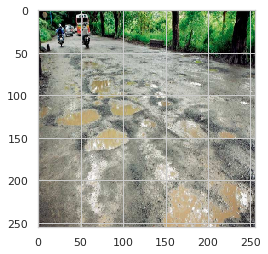

 90%|█████████ | 72/80 [01:03<00:05,  1.51it/s]

Pothole Road


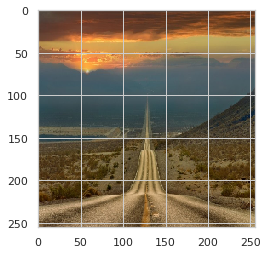

 91%|█████████▏| 73/80 [01:03<00:04,  1.52it/s]

Plain Road


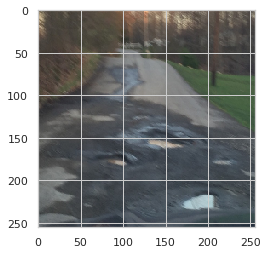

 92%|█████████▎| 74/80 [01:04<00:04,  1.49it/s]

Pothole Road


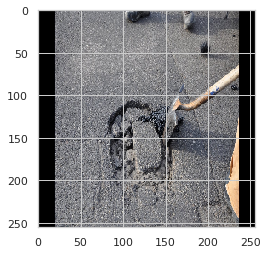

 94%|█████████▍| 75/80 [01:05<00:03,  1.52it/s]

Pothole Road


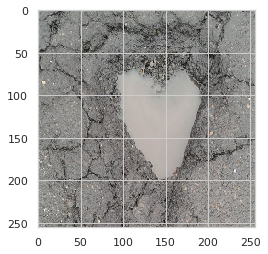

 95%|█████████▌| 76/80 [01:05<00:02,  1.51it/s]

Pothole Road


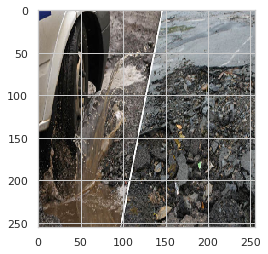

 96%|█████████▋| 77/80 [01:06<00:02,  1.49it/s]

Pothole Road


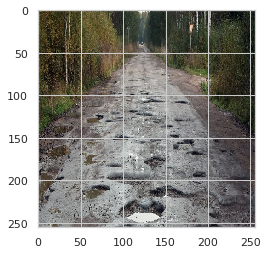

 98%|█████████▊| 78/80 [01:07<00:01,  1.50it/s]

Pothole Road


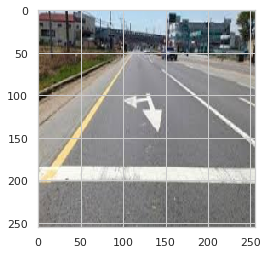

 99%|█████████▉| 79/80 [01:07<00:00,  1.48it/s]

Plain Road


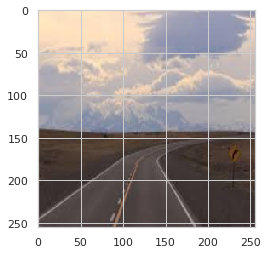

100%|██████████| 80/80 [01:08<00:00,  1.48it/s]

Plain Road


In [16]:
for i in tqdm(files):
    pth = os.path.join(path,i)
    X = cv2.imread(pth,cv2.IMREAD_COLOR)
    X = cv2.resize(X,(256,256))
    plt.figure()
    plt.imshow(X[:,:,::-1]) 
    plt.show()  

    X = np.array(X)
    X = np.expand_dims(X, axis=0)

    y_pred = np.round(model.predict(X))
    if y_pred[0][0] == 1:
        print("Plain Road")
    else:
        print("Pothole Road")

In [0]:
y_predict=model.predict(x_test)
y_predict=np.argmax(y_predict, axis=1)
y_true=np.argmax(y_test, axis=1)

In [18]:
y_predict.shape,y_true.shape

((181,), (181,))

In [19]:
from sklearn.metrics import classification_report
print(classification_report(y_true, y_predict, labels=[0,1]))

              precision    recall  f1-score   support

           0       0.98      0.97      0.97        92
           1       0.97      0.98      0.97        89

    accuracy                           0.97       181
   macro avg       0.97      0.97      0.97       181
weighted avg       0.97      0.97      0.97       181



**Fine Tune**

In [0]:
Res_model.trainable = True

In [21]:
#See how many layers are in the Res model
print("Num of layers in the Res model: ", len(Res_model.layers))

# Fine tune from this layer onwards
fine_tune_at = 100

# Freeze all the layers before the `fine_tune_at` layer
for layer in Res_model.layers[:fine_tune_at]:
  layer.trainable =  False

Number of layers in the base model:  176


In [0]:
model_ft=Sequential()
model_ft.add(Res_model)
model_ft.add(Dropout(0.20))
model_ft.add(Dense(2048,activation='relu'))
model_ft.add(Dense(1024,activation='relu'))
model_ft.add(Dense(512,activation='relu'))
model_ft.add(Dense(2,activation='softmax'))

In [0]:
base_learning_rate = 0.0001
model_ft.compile(optimizer=Adam(lr=1e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [24]:
model_ft.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 2048)              23587712  
_________________________________________________________________
dropout_2 (Dropout)          (None, 2048)              0         
_________________________________________________________________
dense_5 (Dense)              (None, 2048)              4196352   
_________________________________________________________________
dense_6 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
dense_7 (Dense)              (None, 512)               524800    
_________________________________________________________________
dense_8 (Dense)              (None, 2)                 1026      
Total params: 30,408,066
Trainable params: 26,273,282
Non-trainable params: 4,134,784
__________________________________

In [25]:
fine_tune_epochs = 10
initial_epochs =10
total_epochs =  initial_epochs + fine_tune_epochs

history_fine = model_ft.fit(x_train,y_train,
                         epochs=total_epochs,
                         validation_data=(x_test,y_test))

Train on 541 samples, validate on 181 samples
Epoch 1/20
541/541 [==============================] - 17s 31ms/step - loss: 0.9500 - acc: 0.7043 - val_loss: 0.4016 - val_acc: 0.8287
Epoch 2/20
541/541 [==============================] - 7s 13ms/step - loss: 0.2646 - acc: 0.9131 - val_loss: 0.3122 - val_acc: 0.8950
Epoch 3/20
541/541 [==============================] - 7s 13ms/step - loss: 0.1870 - acc: 0.9390 - val_loss: 0.1789 - val_acc: 0.9282
Epoch 4/20
541/541 [==============================] - 7s 13ms/step - loss: 0.0516 - acc: 0.9852 - val_loss: 0.2970 - val_acc: 0.9171
Epoch 5/20
541/541 [==============================] - 7s 13ms/step - loss: 0.0503 - acc: 0.9797 - val_loss: 0.1347 - val_acc: 0.9448
Epoch 6/20
541/541 [==============================] - 7s 13ms/step - loss: 0.0526 - acc: 0.9815 - val_loss: 0.1621 - val_acc: 0.9558
Epoch 7/20
541/541 [==============================] - 7s 13ms/step - loss: 0.0287 - acc: 0.9889 - val_loss: 0.1688 - val_acc: 0.9613
Epoch 8/20
541/541 [==

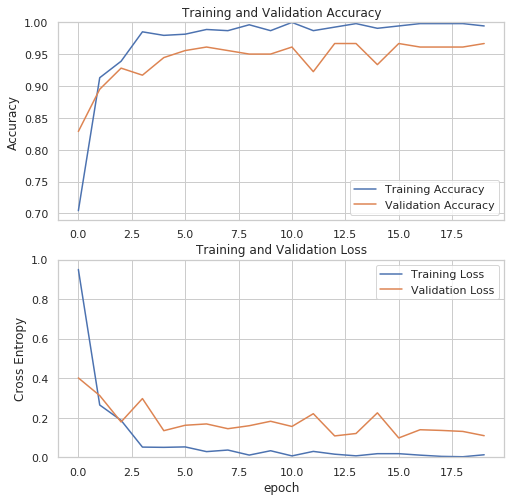

In [26]:
acc = history_fine.history['acc']
val_acc = history_fine.history['val_acc']

loss = history_fine.history['loss']
val_loss = history_fine.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [0]:
y_predict=model_ft.predict(x_test)
y_predict=np.argmax(y_predict, axis=1)
y_true=np.argmax(y_test, axis=1)

In [28]:
from sklearn.metrics import classification_report
print(classification_report(y_true, y_predict, labels=[0,1]))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97        92
           1       0.99      0.94      0.97        89

    accuracy                           0.97       181
   macro avg       0.97      0.97      0.97       181
weighted avg       0.97      0.97      0.97       181

